<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Imports-and-Constants" data-toc-modified-id="Imports-and-Constants-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Imports and Constants</a></span></li><li><span><a href="#Load-Data" data-toc-modified-id="Load-Data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Load Data</a></span></li><li><span><a href="#LSMS-Data-Structure" data-toc-modified-id="LSMS-Data-Structure-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>LSMS Data Structure</a></span><ul class="toc-item"><li><span><a href="#plot-locations" data-toc-modified-id="plot-locations-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>plot locations</a></span></li><li><span><a href="#Country-/-Year-of-Data" data-toc-modified-id="Country-/-Year-of-Data-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Country / Year of Data</a></span></li><li><span><a href="#Check-for-&quot;panel&quot;" data-toc-modified-id="Check-for-&quot;panel&quot;-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Check for "panel"</a></span></li><li><span><a href="#Uniqueness-of-lat-for-each-lon" data-toc-modified-id="Uniqueness-of-lat-for-each-lon-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Uniqueness of lat for each lon</a></span></li></ul></li><li><span><a href="#Create-incountry-folds" data-toc-modified-id="Create-incountry-folds-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Create incountry folds</a></span><ul class="toc-item"><li><span><a href="#Create-country-labels" data-toc-modified-id="Create-country-labels-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Create country labels</a></span></li></ul></li><li><span><a href="#Labels" data-toc-modified-id="Labels-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Labels</a></span><ul class="toc-item"><li><span><a href="#Overall-Label-Distribution" data-toc-modified-id="Overall-Label-Distribution-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Overall Label Distribution</a></span></li><li><span><a href="#Households" data-toc-modified-id="Households-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Households</a></span></li><li><span><a href="#Distributions-per-fold" data-toc-modified-id="Distributions-per-fold-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Distributions per fold</a></span></li></ul></li><li><span><a href="#Label-Deltas" data-toc-modified-id="Label-Deltas-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Label Deltas</a></span><ul class="toc-item"><li><span><a href="#Create-deltas-dataset" data-toc-modified-id="Create-deltas-dataset-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Create deltas dataset</a></span></li><li><span><a href="#Deltas-in-the-labels" data-toc-modified-id="Deltas-in-the-labels-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Deltas in the labels</a></span></li><li><span><a href="#Splitting-into-3-classes" data-toc-modified-id="Splitting-into-3-classes-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span>Splitting into 3 classes</a></span></li></ul></li><li><span><a href="#Visualize-Images" data-toc-modified-id="Visualize-Images-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Visualize Images</a></span><ul class="toc-item"><li><span><a href="#Highest-wealth" data-toc-modified-id="Highest-wealth-7.1"><span class="toc-item-num">7.1&nbsp;&nbsp;</span>Highest wealth</a></span></li><li><span><a href="#Lowest-wealth" data-toc-modified-id="Lowest-wealth-7.2"><span class="toc-item-num">7.2&nbsp;&nbsp;</span>Lowest wealth</a></span></li><li><span><a href="#Largest-positive-delta" data-toc-modified-id="Largest-positive-delta-7.3"><span class="toc-item-num">7.3&nbsp;&nbsp;</span>Largest positive delta</a></span></li><li><span><a href="#Largest-negative-delta" data-toc-modified-id="Largest-negative-delta-7.4"><span class="toc-item-num">7.4&nbsp;&nbsp;</span>Largest negative delta</a></span></li><li><span><a href="#Smallest-absolute-delta" data-toc-modified-id="Smallest-absolute-delta-7.5"><span class="toc-item-num">7.5&nbsp;&nbsp;</span>Smallest absolute delta</a></span></li></ul></li></ul></div>

# Imports and Constants

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from collections import defaultdict
import itertools
import os
import pickle
from pprint import pprint
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats
import seaborn as sns
import tensorflow as tf

sys.path.append('../')
from batchers import batcher, dataset_constants
from data_analysis.create_folds import create_folds, verify_folds
from utils.analysis import calc_r2
from utils.general import colordisplay, load_npz
from utils.geo_plot import setup_ax
from utils.plot import heatmap, boxplot_df, plot_image_by_band

In [3]:
FOLDS = ['A', 'B', 'C', 'D', 'E']
SPLITS = ['train', 'val', 'test']
BAND_ORDER = ['BLUE', 'GREEN', 'RED', 'SWIR1', 'TEMP1', 'SWIR2', 'NIR', 'NIGHTLIGHTS']

# Load Data

In [4]:
# file that Anne sent to me
LSMS_CSV_PATH = '../data/lsms_labels_agg.csv'
lsms_df = pd.read_csv(LSMS_CSV_PATH, float_precision='high')
lsms_df['lat'] = lsms_df['lat'].astype(np.float32)
lsms_df['lon'] = lsms_df['lon'].astype(np.float32)
print(lsms_df.dtypes)

with pd.option_context('display.max_rows', 8):
    display(lsms_df)

lat        float32
lon        float32
year         int64
country     object
index      float64
ea_id        int64
dtype: object


,lat,lon,year,country,index,ea_id
0,-0.292248,31.478722,2005,ug,0.045405,1110003
1,-0.292248,31.478722,2009,ug,-0.333650,1110003
2,-0.292248,31.478722,2013,ug,-0.386531,1110003
3,-0.439120,31.711950,2005,ug,0.310049,0
...,...,...,...,...,...,...
3016,9.917938,11.689417,2010,ng,-0.688097,590
3017,9.917938,11.689417,2015,ng,0.119982,590
3018,9.991906,37.692554,2011,et,-1.261734,3061102207
3019,9.991906,37.692554,2015,et,-1.187214,3061102207


In [5]:
# file that Anne sent to me
LSMS_HOUSEHOLDS_CSV_PATH = '../data/lsms_labels_index_agg_households.csv'
lsms_households_df = pd.read_csv(LSMS_HOUSEHOLDS_CSV_PATH, float_precision='high')
lsms_households_df['lat'] = lsms_households_df['lat'].astype(np.float32)
lsms_households_df['lon'] = lsms_households_df['lon'].astype(np.float32)
print(lsms_households_df.dtypes)

with pd.option_context('display.max_rows', 8):
    display(lsms_households_df)

country         object
year             int64
lat            float32
lon            float32
index          float64
et_index       float64
rooms          float64
electric       float64
phone          float64
radio          float64
tv             float64
auto           float64
floor_qual     float64
toilet_qual    float64
watsup_qual    float64
ea_id            int64
n                int64
dtype: object


,country,year,lat,lon,index,et_index,rooms,electric,phone,radio,tv,auto,floor_qual,toilet_qual,watsup_qual,ea_id,n
0,et,2011,10.016586,38.249226,0.003620,1.711127,2.166667,1.0,0.333333,0.500000,0.500000,0.0,1.000000,2.333333,4.666667,4060100102,6
1,et,2011,10.024511,39.213165,-1.128004,-0.554340,1.000000,0.0,0.000000,0.375000,0.000000,0.0,1.000000,1.625000,3.000000,3050400305,8
2,et,2011,10.081238,34.683189,-0.887478,-0.138021,2.000000,0.0,0.000000,0.750000,0.000000,0.0,1.083333,1.916667,3.083333,6030304202,12
3,et,2011,10.124927,39.671310,0.000374,1.665342,3.555556,1.0,0.333333,0.555556,0.333333,0.0,1.000000,2.000000,4.666667,3050900104,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2911,ug,2013,3.525070,31.713505,-0.694733,NaN,1.857143,0.0,0.285714,0.285714,0.000000,0.0,1.428571,3.000000,3.000000,3090002,7
2912,ug,2013,3.574262,31.132486,-0.784929,NaN,2.000000,0.0,0.555556,0.111111,0.000000,0.0,1.000000,2.111111,3.000000,3130001,9
2913,ug,2013,3.590473,31.725683,0.294094,NaN,2.000000,0.0,1.000000,1.000000,0.000000,0.0,4.000000,3.000000,3.000000,0,1
2914,ug,2013,3.692567,31.731667,1.526652,NaN,3.000000,1.0,1.000000,1.000000,1.000000,0.0,4.000000,4.000000,5.000000,0,1


In [6]:
# merge the DataFrames
# assert that the number of villages without household counts
#    is equal to the difference between the two dataframes
merged_df = pd.merge(
    left=lsms_df, right=lsms_households_df[['lat', 'lon', 'year', 'n']],
    on=['lat', 'lon', 'year'], how='outer')
assert merged_df['n'].isna().sum() == len(lsms_df) - len(lsms_households_df)

print('lsms:', len(lsms_df))
print('lsms households:', len(lsms_households_df))

lsms: 3020
lsms households: 2915


In [7]:
# all villages with 'nan' household counts had 1 household
merged_df.loc[merged_df['n'].isna(), 'n'] = 1
merged_df['n'] = merged_df['n'].astype(np.int64)
lsms_df = merged_df
print(lsms_df.dtypes)
with pd.option_context('display.max_rows', 4):
    display(lsms_df)

lat        float32
lon        float32
year         int64
country     object
index      float64
ea_id        int64
n            int64
dtype: object


,lat,lon,year,country,index,ea_id,n
0,-0.292248,31.478722,2005,ug,0.045405,1110003,8
1,-0.292248,31.478722,2009,ug,-0.333650,1110003,8
...,...,...,...,...,...,...,...
3018,9.991906,37.692554,2011,et,-1.261734,3061102207,9
3019,9.991906,37.692554,2015,et,-1.187214,3061102207,9


In [8]:
mean_households = lsms_df.groupby(['lat', 'lon'])['n'].agg(['mean', 'min', 'max'])
with pd.option_context('display.max_rows', 4):
    display(mean_households)

,,mean,min,max
lat,lon,,,
-16.985500,35.249901,14.0,14,14
-16.600000,34.967300,16.0,16,16
...,...,...,...,...
14.353816,37.890877,8.0,8,8
14.455961,39.479084,11.0,11,11


In [9]:
display(mean_households.loc[mean_households['min'] != mean_households['max']])

,,mean,min,max
lat,lon,,,
-0.987177,30.129835,9.666667,9,10
-0.887125,31.711088,6.666667,6,7
-0.867663,30.354115,8.666667,8,9
-0.860807,30.269276,5.666667,5,6
-0.760571,30.179094,6.666667,6,7
-0.576782,31.691637,7.666667,7,8
0.039344,32.540386,6.666667,6,7
0.058414,29.949335,9.666667,9,10
0.071610,32.092873,9.666667,9,10


In [10]:
CID_TO_C = {
    'et': 'ethiopia',
    'mw': 'malawi',
    'ng': 'nigeria',
    'tz': 'tanzania',
    'ug': 'uganda',
}

CIDS = sorted(lsms_df['country'].unique())
YEARS = np.arange(lsms_df['year'].min(), lsms_df['year'].max() + 1)

country_to_years = {
    'ethiopia': [2011, 2015],
    'malawi': [2010, 2016],
    'nigeria': [2010, 2015],
    'tanzania': [2008, 2012],
    'uganda': [2005, 2009, 2013],
}

In [11]:
# check that (lat, lon, year) is unique across the DataFrame
assert len(set(map(tuple, lsms_df[['lat', 'lon', 'year']].values))) == len(lsms_df)

# LSMS Data Structure

## plot locations

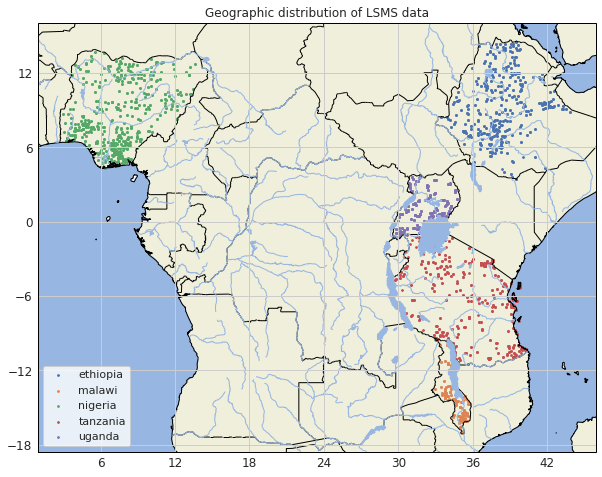

In [12]:
fig = plt.figure(figsize=[10, 10])
ax = setup_ax(fig)
for c, name in CID_TO_C.items():
    locs = lsms_df.loc[lsms_df['country'] == c, ['lat', 'lon']].values
    ax.scatter(x=locs[:, 1], y=locs[:, 0], label=name, s=3)
ax.legend()
ax.set_title('Geographic distribution of LSMS data')
plt.show()

## Country / Year of Data

country    et        mw        ng        tz        ug          
year     2011 2015 2010 2016 2010 2015 2008 2012 2005 2009 2013
num_locs  329  329  102  102  481  481  371  328  166  165  166

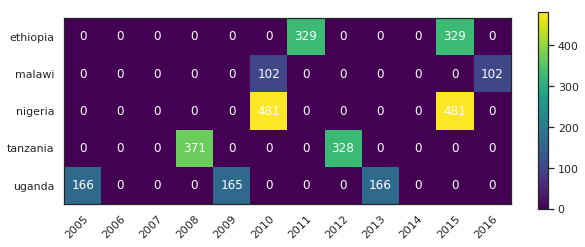

In [13]:
def country_year_heatmap(lsms_df):
    cys_series = lsms_df.groupby(['country', 'year']).size().rename('num_locs')
    display(cys_series.to_frame().T)

    mat = np.zeros([len(CIDS), len(YEARS)], dtype=np.int32)

    for i, cid in enumerate(CIDS):
        for j, y in enumerate(YEARS):
            mat[i, j] = cys_series.get(key=(cid, y), default=0.0)

    heatmap(mat=mat, xlabels=YEARS, ylabels=[CID_TO_C[cid] for cid in CIDS],
            format_spec='{:d}')

country_year_heatmap(lsms_df)

## Check for "panel"

In [14]:
def check_for_panel(lsms_df):
    check_panel_data = []  # (cid, y1, y2, diff (y1-y2), diff (y2-y1))
    for cid in CIDS:
        country_df = lsms_df.loc[lsms_df['country'] == cid, :]
        year_to_locs = {}  # int => set
        cyears = country_df['year'].unique()
        for y in cyears:
            locs = country_df.loc[country_df['year'] == y, ['lat', 'lon']].values
            year_to_locs[y] = set(map(tuple, locs))
        for ya, yb in itertools.combinations(cyears, r=2):
            y1, y2 = min(ya, yb), max(ya, yb)
            diff_y1_y2 = len(year_to_locs[y1] - year_to_locs[y2])
            diff_y2_y1 = len(year_to_locs[y2] - year_to_locs[y1])
            row = [cid, y1, y2, diff_y1_y2, diff_y2_y1]
            check_panel_data.append(row)

    check_panel_df = pd.DataFrame.from_records(
        data=check_panel_data,
        columns=['cid', 'y1', 'y2', 'diff (y1-y2)', 'diff (y2-y1)'])
    check_panel_df.sort_values(['cid', 'y1', 'y2'], inplace=True)
    display(check_panel_df)

check_for_panel(lsms_df)

,cid,y1,y2,diff (y1-y2),diff (y2-y1)
0,et,2011,2015,2,2
1,mw,2010,2016,0,0
2,ng,2010,2015,1,1
3,tz,2008,2012,48,5
4,ug,2005,2009,1,0
5,ug,2005,2013,0,0
6,ug,2009,2013,0,1


## Uniqueness of lat for each lon

- lons are not unique
- `(lon, cid)` is unique (so `(lat, lon, cid)` is also unique)

In [15]:
unique_locs = lsms_df[['lat', 'lon']].drop_duplicates().values
assert unique_locs.dtype == np.float32
print('Number of unique locations:', len(unique_locs))

noverlap_lons = lsms_df.groupby('lon')['lat'].agg(lambda x: x.nunique() > 1).sum()
print('Number of lons with >1 matching lats:', noverlap_lons)

Number of unique locations: 1457
Number of lons with >1 matching lats: 1


In [16]:
# check uniqueness of (lon, cid)
noverlap_lons = lsms_df.groupby(['lon', 'country'])['lat'].agg(lambda x: x.nunique() > 1).sum()
print('Number of (lon, cid) with >1 matching lats:', noverlap_lons)
assert noverlap_lons == 0

Number of (lon, cid) with >1 matching lats: 0


# Create incountry folds

This section assumes that `preprocessing/process_tfrecords_lsms.ipynb` and `models/baselines_lsms.ipynb` have already been run because it loads the image histograms `npz` file.

Maximum side lengths in degrees lat/lon of a 224x224 px image at 30m/px

```
maximum side_lat: 0.060570
maximum side_lon: 0.070361
```
(see `data_analysis/dhs.ipynb`)

In [17]:
npz = load_npz('../data/lsms_image_hists.npz')
locs = npz['locs']
labels = npz['labels']
years = npz['years']

image_hists: dtype=int64, shape=(3020, 8, 102)
labels: dtype=float32, shape=(3020,)
locs: dtype=float32, shape=(3020, 2)
years: dtype=int32, shape=(3020,)
nls_center: dtype=float32, shape=(3020,)
nls_mean: dtype=float32, shape=(3020,)


num clusters: 166
max cluster size: 54
num outliers: 870


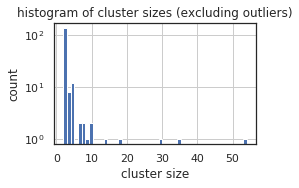

A B 0.09316818668795265
A C 0.09698635776641168
A D 0.0944328306997889
A E 0.09506203687192395
B C 0.09334907897727049
B D 0.09566940873908972
B E 0.09298662248251378
C D 0.09664187084455265
C E 0.09629685083778979
D E 0.09429247629973826
Size of each fold
{'A': 604, 'B': 604, 'C': 604, 'D': 604, 'E': 604}


In [18]:
MIN_DIST = 0.092841  # np.sqrt(0.060570**2 + 0.070361**2)
DIST_METRIC = 'euclidean'

locs_to_indices, incountry_folds = create_folds(
    locs, min_dist=MIN_DIST, dist_metric=DIST_METRIC, fold_names=FOLDS)
verify_folds(incountry_folds, locs=locs, min_dist=MIN_DIST,
             dist_metric=DIST_METRIC, max_index=3020)

print('Size of each fold')
sizes = {}
for fold, indices in incountry_folds.items():
    assert len(indices) == 604  # check fold size
    sizes[fold] = len(indices)
pprint(sizes)

# create train/val/test splits
folds = {}
for i, f in enumerate(FOLDS):
    folds[f] = {}
    folds[f]['test'] = incountry_folds[f]

    val_f = FOLDS[(i+1) % 5]
    folds[f]['val'] = incountry_folds[val_f]

    train_fs = [FOLDS[(i+2) % 5], FOLDS[(i+3) % 5], FOLDS[(i+4) % 5]]
    folds[f]['train'] = np.sort(np.concatenate([incountry_folds[f] for f in train_fs]))

In [19]:
file_path = '../data/lsms_incountry_folds.pkl'
if not os.path.exists(file_path):
    with open(file_path, 'wb') as f:
        pickle.dump(folds, f)

with open(file_path, 'rb') as f:
    saved_folds = pickle.load(f)
for f in FOLDS:
    for split in SPLITS:
        assert np.array_equal(folds[f][split], saved_folds[f][split])

## Create country labels

In [20]:
# create mapping: loc => country
loc_to_country = (lsms_df
    .groupby(['lat', 'lon'])
    .apply(lambda df: df['country'].iloc[0])
    .map(CID_TO_C)
    .to_dict())

In [21]:
country_indices = defaultdict(list)  # country => np.array of indices
country_labels = np.zeros(len(lsms_df), dtype=np.int32)  # np.array of country labels

for i, loc in enumerate(locs):
    country = loc_to_country[tuple(loc)]
    country_indices[country].append(i)

for i, country in enumerate(dataset_constants.LSMS_COUNTRIES):
    country_indices[country] = np.asarray(country_indices[country])
    indices = country_indices[country]
    country_labels[indices] = i

# Labels

## Overall Label Distribution

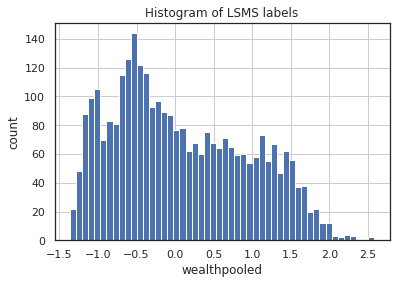

In [20]:
ax = lsms_df['index'].hist(bins=50)
ax.set_xlabel('wealthpooled')
ax.set_ylabel('count')
ax.set_title('Histogram of LSMS labels')
plt.show()

In [21]:
lsms_country = lsms_df.groupby('country')['index'].describe()
colordisplay(lsms_country)

,count,mean,std,min,25%,50%,75%,max
country,,,,,,,,
et,658,-0.839208,0.396562,-1.36373,-1.10699,-0.975568,-0.698495,0.842986
mw,204,-0.248679,0.456715,-0.881727,-0.566406,-0.424548,0.00331688,1.62419
ng,962,0.891711,0.646072,-0.849615,0.416661,0.966856,1.39975,2.58245
tz,699,-0.144047,0.568633,-1.03179,-0.587713,-0.335593,0.222911,2.0771
ug,497,0.117302,0.703269,-1.31778,-0.360072,-0.0380194,0.579641,2.13109


In [24]:
cy_multiindex = lsms_df.groupby(['country', 'year']).size().index
display(cy_multiindex)

CMAP_FN = plt.cm.get_cmap('Set2')
COUNTRY_YEAR_COLORS = [CMAP_FN.colors[i % 8] for i in cy_multiindex.codes[0]]

MultiIndex(levels=[['et', 'mw', 'ng', 'tz', 'ug'], [2005, 2008, 2009, 2010, 2011, 2012, 2013, 2015, 2016]],
           codes=[[0, 0, 1, 1, 2, 2, 3, 3, 4, 4, 4], [4, 7, 3, 8, 3, 7, 1, 5, 0, 2, 6]],
           names=['country', 'year'])

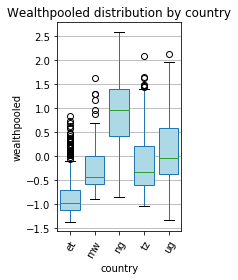

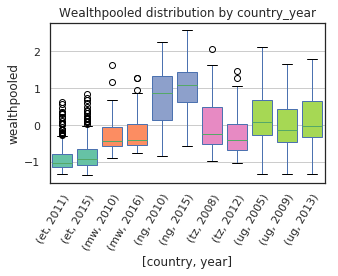

In [25]:
boxplot_df(lsms_df, y='index', by='country',
           figsize=[3, 4], ylabel='wealthpooled',
           title='Wealthpooled distribution by country',
           colors=['lightblue' for _ in CIDS])

boxplot_df(lsms_df, y='index', by=['country', 'year'],
           figsize=[5, 4], ylabel='wealthpooled',
           title='Wealthpooled distribution by country_year',
           colors=COUNTRY_YEAR_COLORS)

## Households

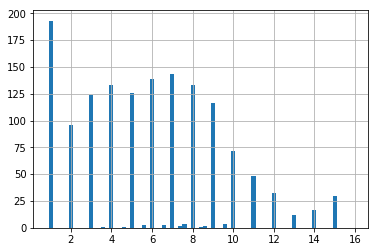

In [26]:
_ = mean_households['mean'].hist(bins=np.arange(0.9, 16.1, 0.2))

## Distributions per fold

In [27]:
def my_func(s):
    '''
    Args
    - s: pd.Series, index=['lat', 'lon'], type float32, represents a single location

    Returns
    - fold: str, the name of the test fold that the loc belongs to
    '''
    indices = locs_to_indices[(s['lat'], s['lon'])]
    i = indices[0]
    for f in folds:
        if i in folds[f]['test']:
            return f

lsms_df['test_fold'] = lsms_df[['lat', 'lon']].apply(my_func, axis=1)

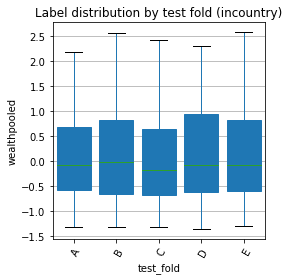

In [28]:
boxplot_df(lsms_df, y='index', by='test_fold',
           figsize=[4, 4], ylabel='wealthpooled',
           title='Label distribution by test fold (incountry)',
           colors=[None for _ in FOLDS])

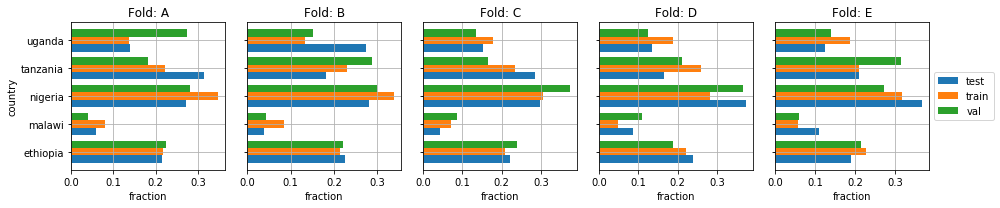

In [29]:
def plot_countries_by_split(folds, country_indices):
    '''
    Args
    - folds: dict, folds[f][split] is a np.array of indices
    - country_indices: dict, country (str) => np.array of indices
    '''
    fig, axs = plt.subplots(1, 5, figsize=[14, 3], sharey=True)
    for f, ax in zip(FOLDS, axs.flat):
        data = []
        for split in folds[f]:
            for country, indices in country_indices.items():
                count = len(np.intersect1d(folds[f][split], indices))
                row = (split, country, count)
                data.append(row)
        df = pd.DataFrame.from_records(data, columns=['split', 'country', 'count'])
        df['count'] = df['count'] / df.groupby('split')['count'].transform('sum')
        df = df.pivot(index='country', columns='split', values='count')
        df.plot.barh(ax=ax, grid=True, width=0.8, legend=False)
        ax.set_xlabel('fraction')
        ax.set_title(f'Fold: {f}')

    axs[-1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    fig.tight_layout()

plot_countries_by_split(folds, country_indices)

# Label Deltas

## Create deltas dataset

In [30]:
def create_deltas_dataset(locs_to_indices, households_df, country_labels,
                          countries, years, save_path):
    '''
    Args
    - locs_to_indices: dict
    - households_df: pd.DataFrame, index is [lat, lon], has column 'mean'
    - country_labels: np.array, shape [N], type int32, index of country
    - countries: list of str, countries corresponding to country labels
    - years: np.array, shape [N], type int32
    - save_path: str, path to save CSV
    '''
    delta_pairs_data = []
    for loc, indices in locs_to_indices.items():
        h = households_df.loc[tuple(loc), 'mean']
        if len(indices) == 1:
            continue
        for i1, i2 in itertools.combinations(indices, r=2):
            assert years[i2] > years[i1]
            assert country_labels[i1] == country_labels[i2]
            country = countries[country_labels[i1]]
            row = [country, years[i1], years[i2], i1, i2, h]
            delta_pairs_data.append(row)
    delta_pairs_df = pd.DataFrame.from_records(
        delta_pairs_data, columns=['country', 'year1', 'year2', 'index1', 'index2', 'households'])
    delta_pairs_df['households'] = delta_pairs_df['households'].astype(np.float32)

    if not os.path.exists(save_path):
        delta_pairs_df.to_csv(save_path, header=True, index=False)

    delta_pairs_df_saved = pd.read_csv(save_path, index_col=False, float_precision='high')
    delta_pairs_df_saved['households'] = delta_pairs_df_saved['households'].astype(np.float32)
    assert delta_pairs_df_saved.equals(delta_pairs_df)

    return delta_pairs_df

In [31]:
save_path = '../data/lsms_deltas_pairs.csv'

delta_pairs_df = create_deltas_dataset(
    locs_to_indices,
    households_df=mean_households,
    country_labels=country_labels,
    countries=dataset_constants.LSMS_COUNTRIES,
    years=years,
    save_path=save_path)

with pd.option_context('display.max_rows', 4):
    display(delta_pairs_df)

,country,year1,year2,index1,index2,households
0,ethiopia,2011,2015,0,329,6.0
1,ethiopia,2011,2015,1,330,9.0
...,...,...,...,...,...,...
1726,uganda,2005,2013,2688,3019,4.0
1727,uganda,2009,2013,2814,3019,4.0


## Deltas in the labels

In [32]:
deltas_list = [
    ('et', 2011, 2015),
    ('mw', 2010, 2016),
    ('ng', 2010, 2015),
    ('tz', 2008, 2012),
    ('ug', 2005, 2009),
    ('ug', 2005, 2013),
    ('ug', 2009, 2013)
]

In [33]:
def plot_deltas(delta_pairs_df, labels, country, years):
    '''
    Args
    - delta_pairs_df: pd.DataFrame, columns ['country', 'year1', 'year2', 'index1', 'index2']
    - labels: np.array
    - country: str, or None for all countries
    - years: tuple of int (y1, y2), or None for all year pairs
    '''
    df = delta_pairs_df
    if country is not None:
        df = df.loc[df['country'] == country, :]
    if years is not None:
        y1, y2 = years
        df = df.loc[(df['year1'] == y1) & (df['year2'] == y2), :]
    else:
        y1, y2 = 'before', 'after'

    index1 = df['index1']
    index2 = df['index2']
    deltas = labels[index2] - labels[index1]

    # histogram distribution of (y2 - y1) labels
    title = f'Distribution of deltas ({y2}-{y1})'
    if country is not None:
        title += f': {country}'
    fig, ax = plt.subplots(1, 1, figsize=[5, 3], constrained_layout=True)
    ax.hist(deltas, bins=50, range=(-2.5, 2.5))
    ax.set(xlabel='delta y2-y1', ylabel='count')
    ax.set_title(title)
    ax.grid(True)
    plt.show()

    display(pd.Series(deltas).describe().to_frame().T)

    fig, ax = plt.subplots(1, 1, figsize=[4, 4])
    labels_df = pd.DataFrame({str(y1): labels[index1], str(y2): labels[index2]})
    r2 = calc_r2(labels[index1], labels[index2])
    legend = f'r2: {r2:.1f}'
    sns.regplot(data=labels_df, x=str(y1), y=str(y2), ax=ax, ci=None, scatter_kws={'s': 5}, label=legend)
    ax.grid(True)
    ax.legend(loc='best')
    ax.set_aspect('equal')
    if country is not None:
        ax.set_title(country)
    fig.tight_layout()
    plt.show()

    # get counts of +,0,-
    delta_signs = np.sign(deltas)
    unique, unique_counts = np.unique(delta_signs, return_counts=True)
    counts = {-1: 0, 0: 0, 1: 0}
    for sign, count in zip(unique, unique_counts):
        counts[int(sign)] = count
    return counts

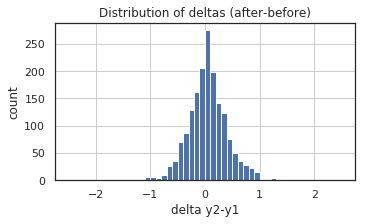

,count,mean,std,min,25%,50%,75%,max
0,1728.0,0.042158,0.368792,-2.105055,-0.167891,0.036435,0.243493,2.070537


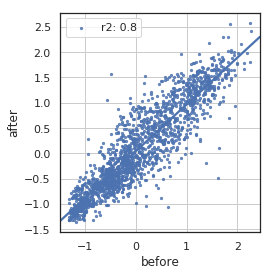

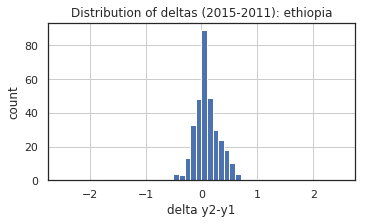

,count,mean,std,min,25%,50%,75%,max
0,327.0,0.090125,0.238173,-1.692234,-0.041971,0.069973,0.214635,1.050697


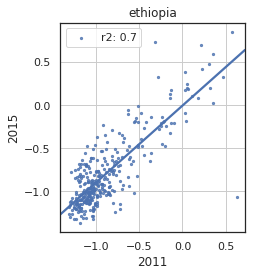

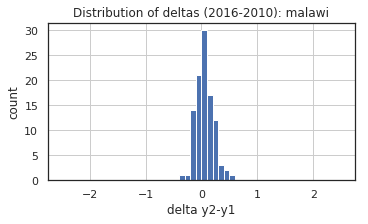

,count,mean,std,min,25%,50%,75%,max
0,102.0,0.057807,0.149286,-0.337704,-0.028275,0.049001,0.145425,0.505075


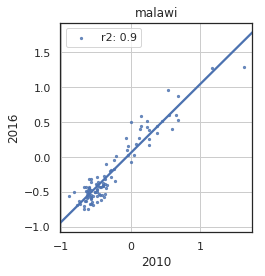

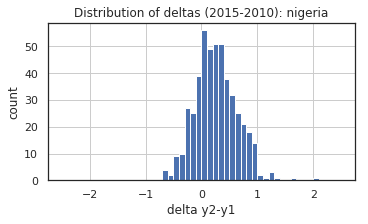

,count,mean,std,min,25%,50%,75%,max
0,480.0,0.258623,0.375518,-0.676418,0.006005,0.247009,0.487036,2.070537


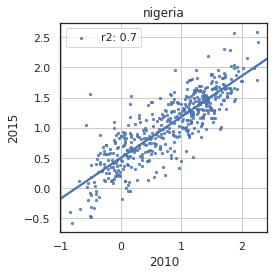

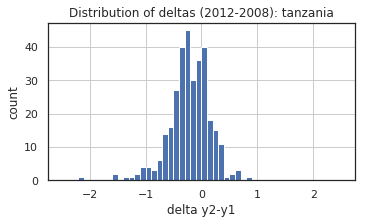

,count,mean,std,min,25%,50%,75%,max
0,323.0,-0.217802,0.368494,-2.105055,-0.401056,-0.207839,0.022899,0.870075


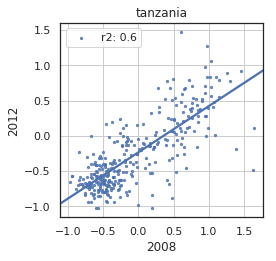

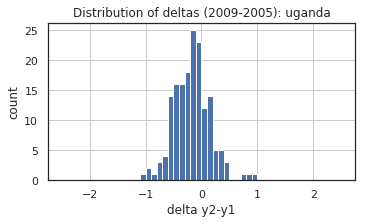

,count,mean,std,min,25%,50%,75%,max
0,165.0,-0.177713,0.321864,-1.028003,-0.379055,-0.165392,0.0,0.936426


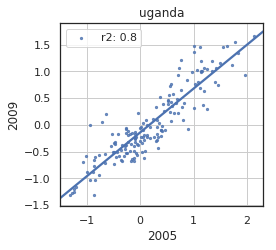

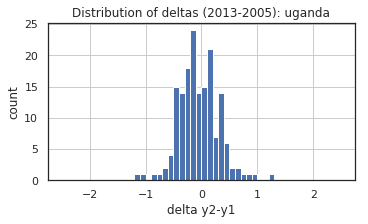

,count,mean,std,min,25%,50%,75%,max
0,166.0,-0.047852,0.353554,-1.137635,-0.281095,-0.07586,0.17094,1.218068


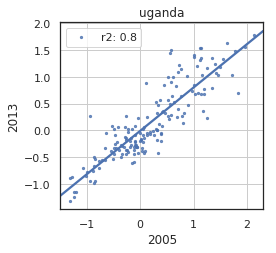

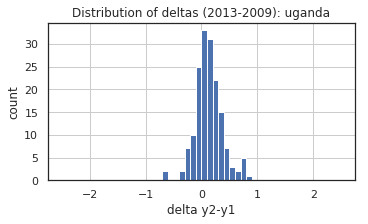

,count,mean,std,min,25%,50%,75%,max
0,165.0,0.127023,0.242579,-0.644181,-0.024711,0.110827,0.25408,0.853818


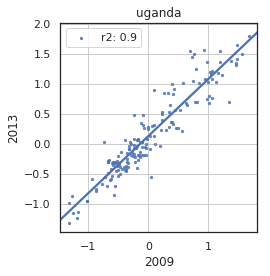

-1  0    1
country  y1     y2                
ethiopia 2011   2015   102  1  224
malawi   2010   2016    37  0   65
nigeria  2010   2015   116  0  364
tanzania 2008   2012   232  0   91
uganda   2005   2009   123  1   41
                2013    95  1   70
         2009   2013    46  2  117
overall  before after  751  5  972

In [34]:
overall_signs = plot_deltas(delta_pairs_df, labels, country=None, years=None)

def plot_label_deltas(delta_pairs_df, labels, deltas_list):
    df = pd.DataFrame(columns=['country', 'y1', 'y2', -1, 0, 1])
    df.set_index(['country', 'y1', 'y2'], inplace=True)

    for (cid, y1, y2) in deltas_list:
        country = CID_TO_C[cid]
        years = (y1, y2)
        sign_counts = plot_deltas(delta_pairs_df, labels, country, years)
        df.loc[(country, y1, y2)] = sign_counts
    return df

signs_df = plot_label_deltas(delta_pairs_df, labels, deltas_list)
signs_df.loc[('overall', 'before', 'after')] = overall_signs
display(signs_df)

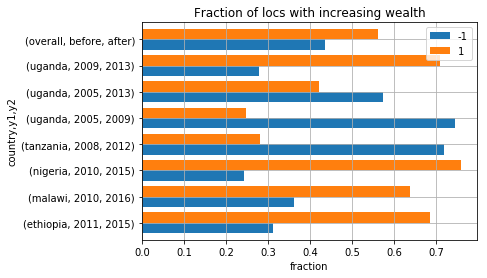

In [35]:
ax = signs_df.div(signs_df.sum(axis=1), axis=0)[[-1, 1]].plot(kind='barh', grid=True, width=0.8)
ax.set_xlabel('fraction')
ax.set_title('Fraction of locs with increasing wealth')
plt.show()

## Splitting into 3 classes

In [36]:
# forward direction only
deltas = np.sort(labels[delta_pairs_df['index2']] - labels[delta_pairs_df['index1']])
print('min:', deltas[0])
print('1/3:', deltas[int(1/3 * len(deltas))])
print('2/3:', deltas[int(2/3 * len(deltas))])
print('max:', deltas[-1])

# using -0.125 and 0.125 as cut-offs
print('class (-):', np.sum(deltas < -0.125) / len(deltas))
print('class (0):', np.sum((deltas >= -0.125) & (deltas <= 0.125)) / len(deltas))
print('class (+):', np.sum(deltas > 0.125) / len(deltas))

min: -2.105055
1/3: -0.08316094
2/3: 0.15722847
max: 2.0705366
class (-): 0.2934027777777778
class (0): 0.3287037037037037
class (+): 0.37789351851851855


In [37]:
# forward and backward directions
deltas_aug = np.sort(np.concatenate([deltas, -deltas]))
print('min:', deltas_aug[0])
print('1/3:', deltas_aug[int(len(deltas_aug) / 3)])
print('2/3:', deltas_aug[int(2 * len(deltas_aug) / 3)])
print('max:', deltas_aug[-1])

# using -0.125 and 0.125 as cut-offs
print('class (-):', np.sum(deltas_aug < -0.125) / len(deltas_aug))
print('class (0):', np.sum((deltas_aug >= -0.125) & (deltas_aug <= 0.125)) / len(deltas_aug))
print('class (+):', np.sum(deltas_aug > 0.125) / len(deltas_aug))

min: -2.105055
1/3: -0.12543026
2/3: 0.12543029
max: 2.105055
class (-): 0.33564814814814814
class (0): 0.3287037037037037
class (+): 0.33564814814814814


# Visualize Images

In [38]:
tfrecord_paths = np.asarray(batcher.get_lsms_tfrecord_paths(dataset_constants.SURVEY_NAMES['LSMS']))
K = 8

In [39]:
def get_images(tfrecord_paths):
    '''
    Args
    - tfrecord_paths: list of str, length N <= 32, paths of TFRecord files

    Returns: np.array, shape [N, 224, 224, 8], type float32
    '''
    lsms_batcher = batcher.Batcher(
        tfrecord_files=tfrecord_paths,
        dataset='LSMS',
        batch_size=32,
        ls_bands='ms',
        nl_band='merge',
        label_name='wealthpooled',
        shuffle=False,
        augment=False,
        negatives='zero',
        normalize=True)
    init_iter, batch_op = lsms_batcher.get_batch()
    with tf.Session() as sess:
        sess.run(init_iter)
        images = sess.run(batch_op['images'])
    return images

In [40]:
def plot_images_by_wealth(indices, images, labels, years, locs,
                          country_labels, countries, title_str):
    '''
    Args
    - indices: np.array, shape [K], type int64
    - images: np.array, shape [K, 224, 224, 8]
    - labels: np.array, shape [N], type float32
    - years: np.array, shape [N], type int32
    - locs: np.array, shape [N, 2], type float32
    - country_labels: np.array, shape [N], type int32
    - countries: list of str, names of countries corresponding to country labels
    - title_str: format str, contains variables [k, label, country, year, lat, lon]
    '''
    for k, i in enumerate(indices):
        img = images[k]
        label, year, loc = labels[i], years[i], locs[i]
        lat, lon = tuple(loc)
        country = countries[country_labels[i]]
        title = title_str.format(k=k+1, label=label, country=country, year=year, lat=lat, lon=lon)
        print(title)
        band_order = list(BAND_ORDER)  # make a copy
        band_order[-1] = 'DMSP' if year < 2012 else 'VIIRS'
        plot_image_by_band(img, band_order, nrows=1, title=None, rgb='merge')

## Highest wealth

Instructions for updating:
Colocations handled automatically by placer.
1-th highest wealth: 2.582450, loc = nigeria 2015 (7.431634, 3.951272)


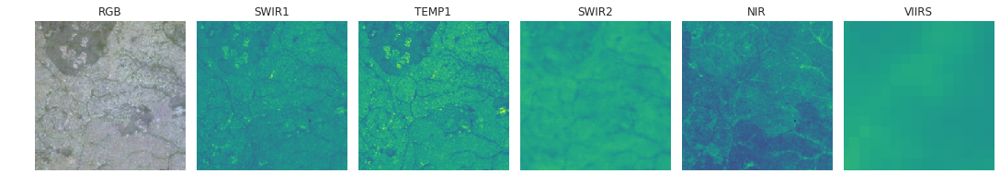

2-th highest wealth: 2.565660, loc = nigeria 2015 (6.470417, 7.487631)


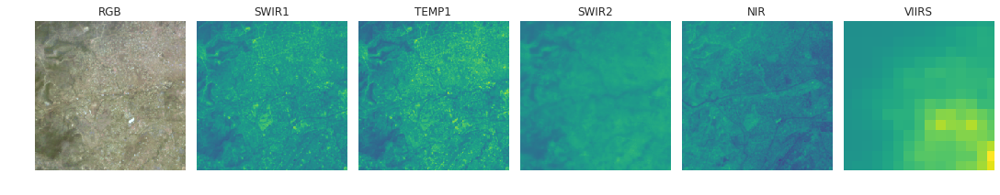

3-th highest wealth: 2.422774, loc = nigeria 2015 (5.535456, 7.531536)


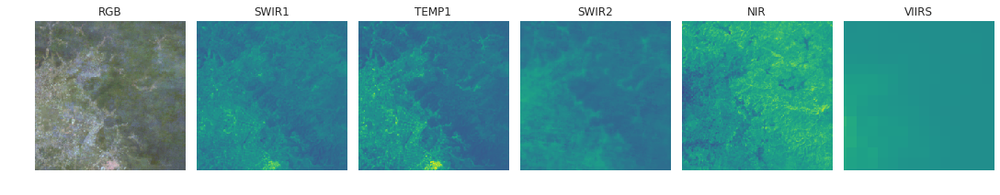

4-th highest wealth: 2.308109, loc = nigeria 2015 (4.860018, 7.058599)


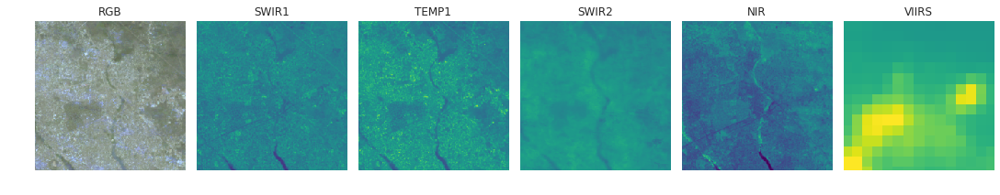

5-th highest wealth: 2.297014, loc = nigeria 2015 (5.011590, 7.949626)


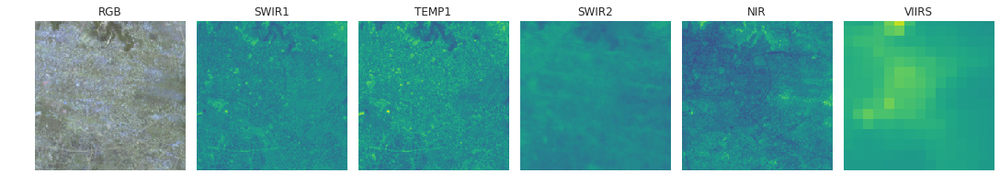

6-th highest wealth: 2.268149, loc = nigeria 2010 (5.535456, 7.531536)


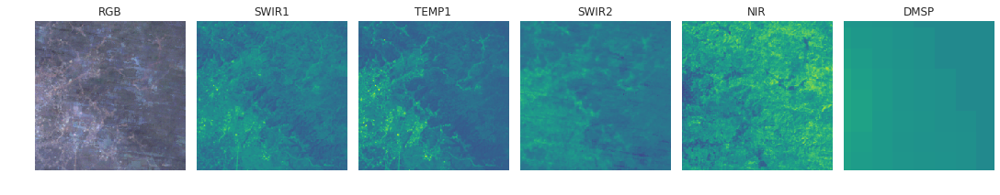

7-th highest wealth: 2.253869, loc = nigeria 2010 (11.987756, 8.529767)


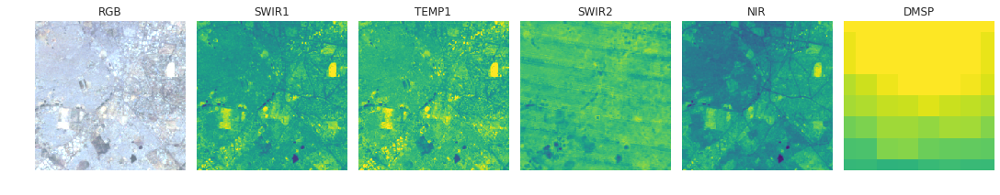

8-th highest wealth: 2.253066, loc = nigeria 2010 (7.431634, 3.951272)


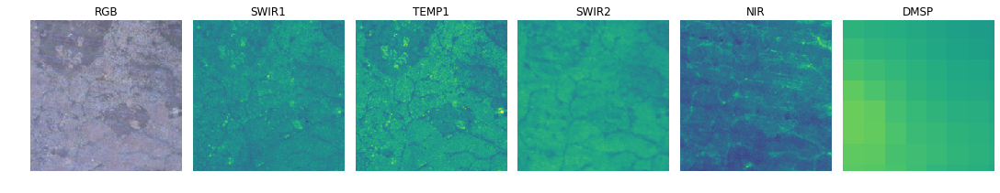

In [41]:
indices = np.argsort(labels)[::-1][:K]  # indices of K wealthiest images
images = get_images(tfrecord_paths[indices])
title_str = '{k}-th highest wealth: {label:.06f}, loc = {country} {year} ({lat:.06f}, {lon:.06f})'
plot_images_by_wealth(indices, images, labels, years, locs,
                      country_labels=country_labels,
                      countries=dataset_constants.LSMS_COUNTRIES,
                      title_str=title_str)

## Lowest wealth

1-th lowest wealth: -1.363729, loc = ethiopia 2015 (3.982931, 38.491367)


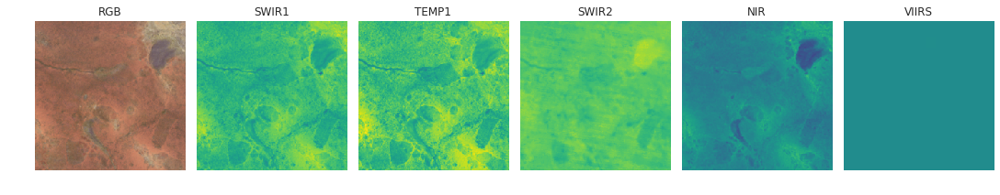

2-th lowest wealth: -1.317778, loc = ethiopia 2015 (8.400071, 33.938507)


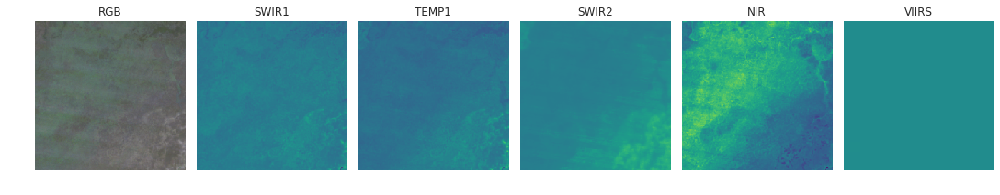

3-th lowest wealth: -1.317778, loc = uganda 2005 (3.086549, 34.137653)


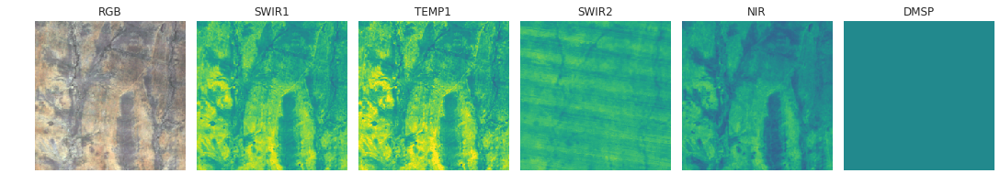

4-th lowest wealth: -1.317778, loc = uganda 2013 (2.581154, 34.575676)


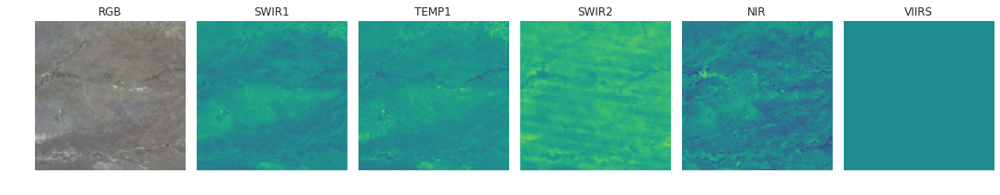

5-th lowest wealth: -1.317778, loc = ethiopia 2011 (12.801716, 36.930313)


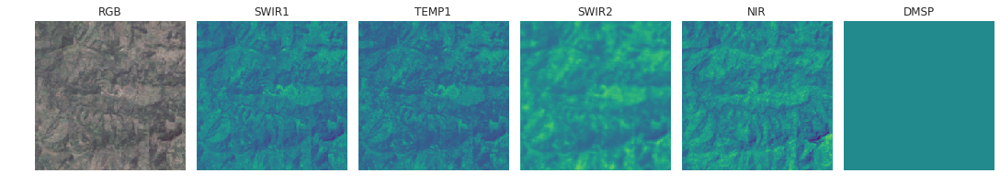

6-th lowest wealth: -1.317778, loc = uganda 2005 (2.581154, 34.575676)


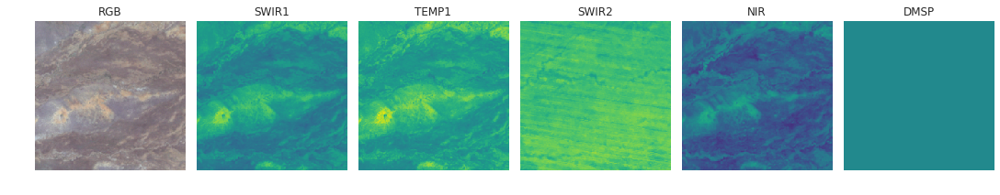

7-th lowest wealth: -1.317778, loc = uganda 2009 (2.581154, 34.575676)


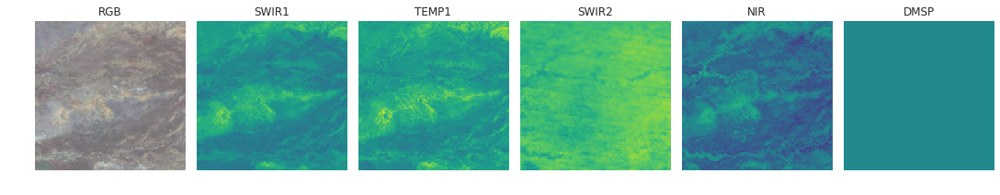

8-th lowest wealth: -1.317778, loc = ethiopia 2015 (12.254391, 38.652576)


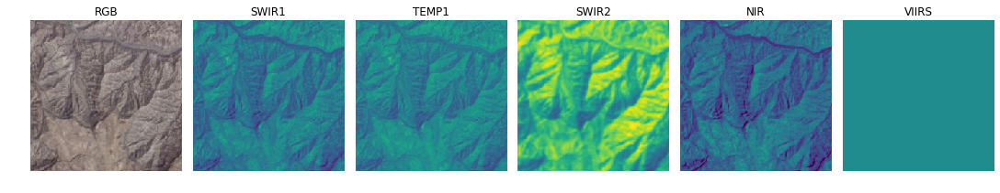

In [42]:
indices = np.argsort(labels)[:K]  # indices of K poorest images
images = get_images(tfrecord_paths[indices])
title_str = '{k}-th lowest wealth: {label:.06f}, loc = {country} {year} ({lat:.06f}, {lon:.06f})'
plot_images_by_wealth(indices, images, labels, years, locs,
                      country_labels=country_labels,
                      countries=dataset_constants.LSMS_COUNTRIES,
                      title_str=title_str)

## Largest positive delta

In [43]:
def plot_images_by_delta(paired_indices, images1, images2, labels, years, locs, order,
                         country_labels, countries):
    '''
    Args
    - paired_indices: np.array, shape [K, 2], type int64
    - images1, images2: np.array, shape [K, 224, 224, 8]
        correspond to 1st and 2nd column of indices, respectively
    - labels: np.array, shape [N]
    - years: np.array, shape [N]
    - locs: np.array, shape [N, 2]
    - order: str, one of ['highest', 'lowest']
    - country_labels: np.array, shape [N], type int32
    - countries: list of str, names of countries corresponding to country labels
    '''
    for k, pair in enumerate(paired_indices):
        i1, i2 = pair
        assert np.all(locs[i1] == locs[i2])
        lat, lon = tuple(locs[i1])
        country = countries[country_labels[i1]]

        print('{k}-th {order} delta, loc = {country} ({lat:.06f}, {lon:.06f})'.format(
            k=k+1, order=order, country=country, lat=lat, lon=lon))
        print('({y1}) {l1:.06f}, ({y2}) {l2:.06f}, diff={diff:.06f}'.format(
            y1=years[i1], y2=years[i2], l1=labels[i1], l2=labels[i2], diff=labels[i2]-labels[i1]))
        for i, images in [(i1, images1), (i2, images2)]:
            img = images[k]
            year = years[i]
            band_order = list(BAND_ORDER)  # make a copy
            band_order[-1] = 'DMSP' if year < 2012 else 'VIIRS'
            plot_image_by_band(img, band_order, nrows=1, title=None, rgb='merge')

In [44]:
deltas = labels[delta_pairs_df['index2']] - labels[delta_pairs_df['index1']]

1-th largest (+) delta, loc = nigeria (5.771212, 7.776873)
(2010) -0.504785, (2015) 1.565752, diff=2.070537


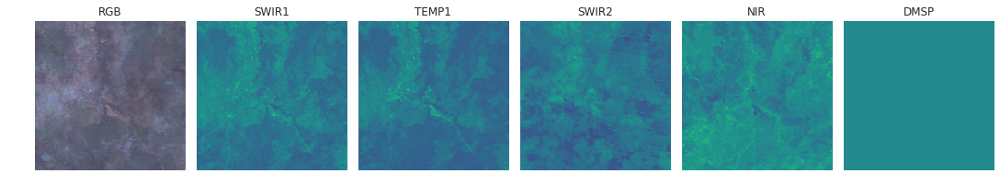

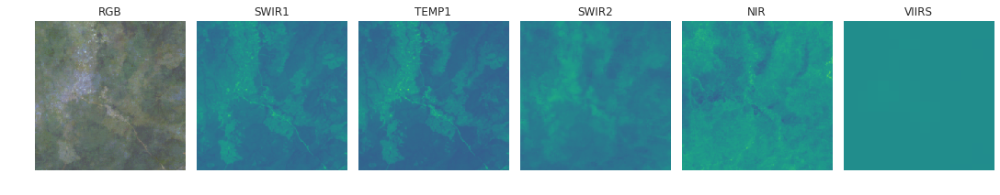

2-th largest (+) delta, loc = nigeria (11.499152, 10.071320)
(2010) -0.580366, (2015) 1.054305, diff=1.634671


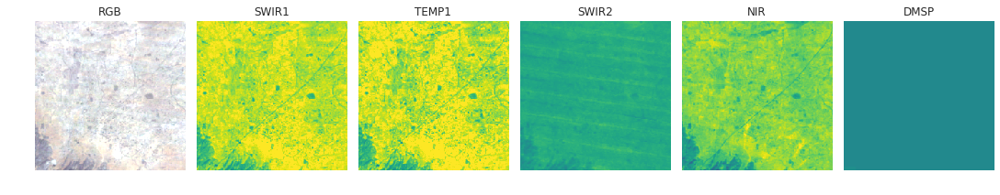

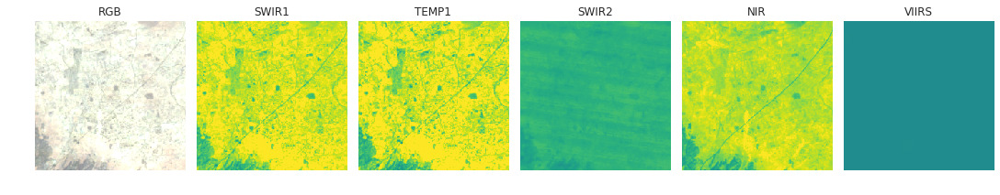

3-th largest (+) delta, loc = nigeria (6.716282, 8.947615)
(2010) 0.167222, (2015) 1.525269, diff=1.358048


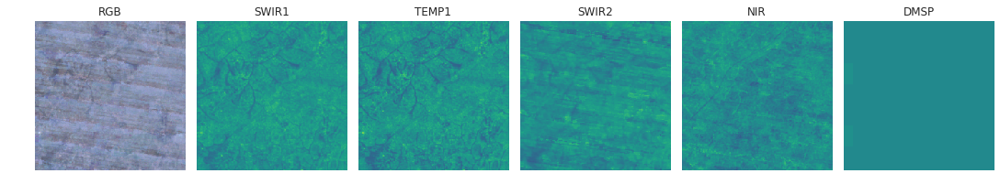

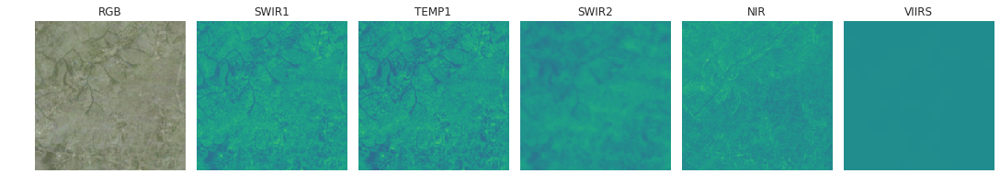

4-th largest (+) delta, loc = nigeria (7.310150, 9.822583)
(2010) 0.147902, (2015) 1.390551, diff=1.242649


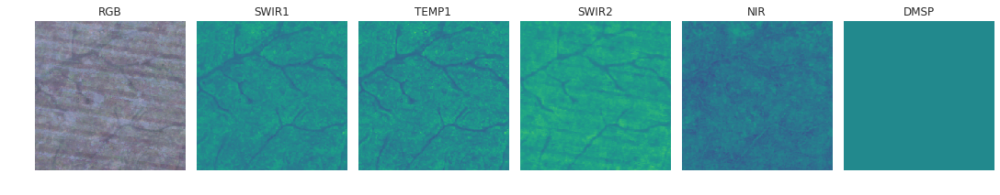

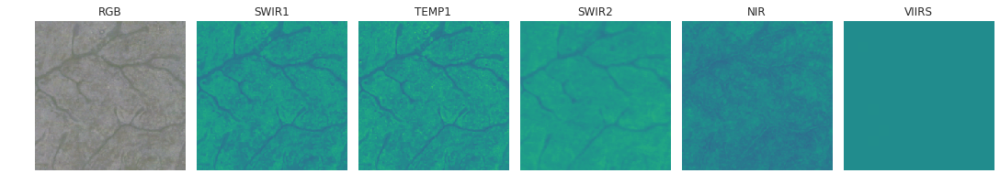

5-th largest (+) delta, loc = nigeria (7.215414, 4.947545)
(2010) -0.352746, (2015) 0.875435, diff=1.228181


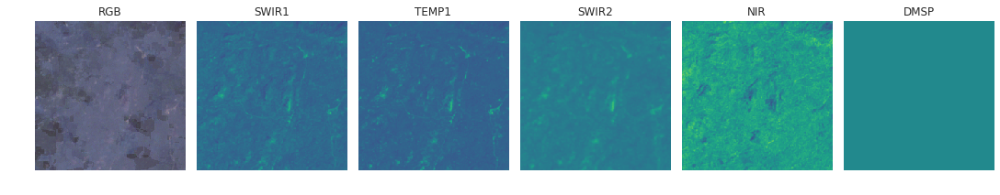

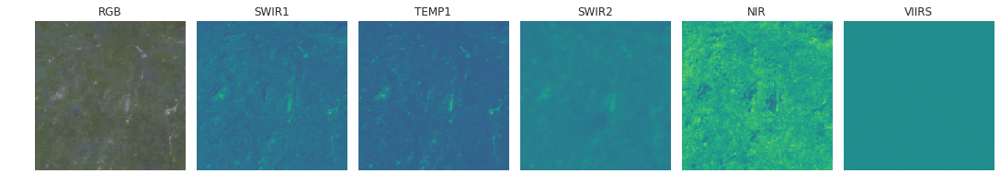

6-th largest (+) delta, loc = uganda (3.590473, 31.725683)
(2005) -0.941487, (2013) 0.276580, diff=1.218068


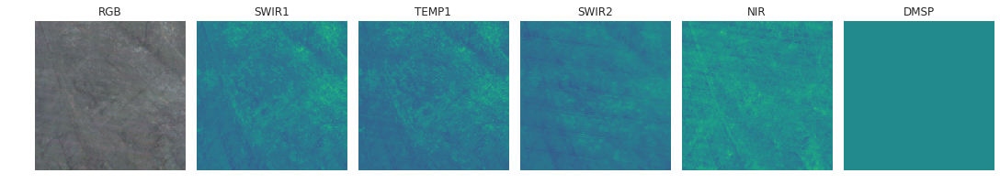

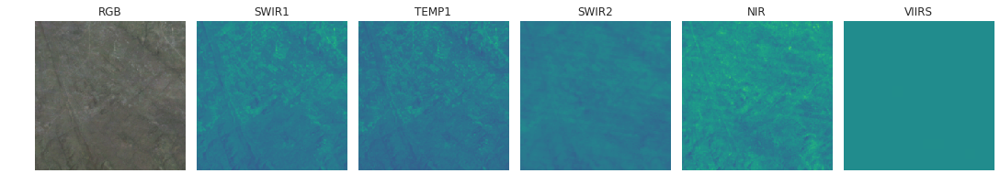

7-th largest (+) delta, loc = nigeria (9.456363, 7.404969)
(2010) -0.116150, (2015) 1.096845, diff=1.212994


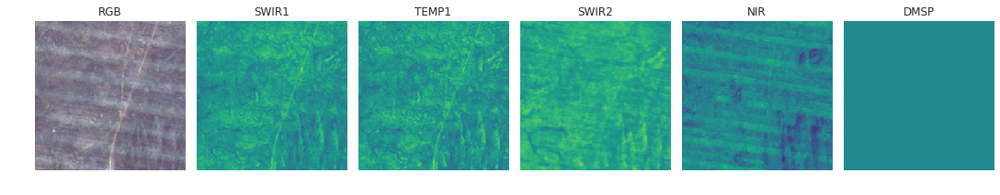

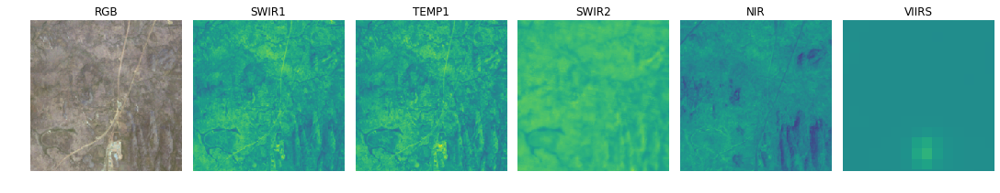

8-th largest (+) delta, loc = nigeria (8.746292, 9.608171)
(2010) -0.110157, (2015) 0.994044, diff=1.104201


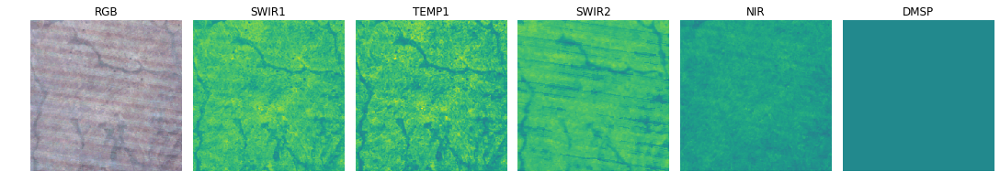

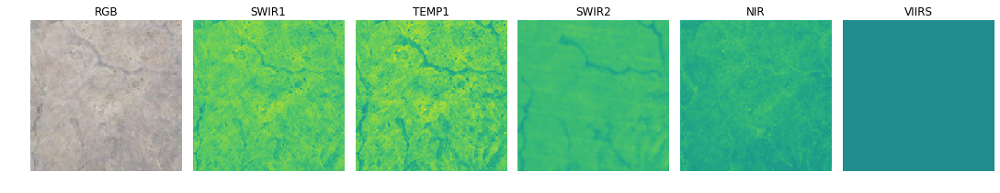

In [45]:
sorted_delta_indices = np.argsort(deltas)[::-1]
paired_indices = delta_pairs_df.loc[sorted_delta_indices[:K], ['index1', 'index2']].values
images1 = get_images(tfrecord_paths[paired_indices[:, 0]])
images2 = get_images(tfrecord_paths[paired_indices[:, 1]])

plot_images_by_delta(
    paired_indices, images1, images2, labels, years, locs,
    order='largest (+)',
    countries=dataset_constants.LSMS_COUNTRIES,
    country_labels=country_labels)

## Largest negative delta

1-th largest (-) delta, loc = tanzania (-10.920880, 39.292690)
(2008) 1.621506, (2012) -0.483549, diff=-2.105055


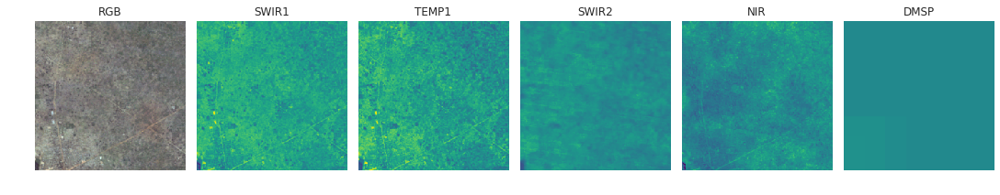

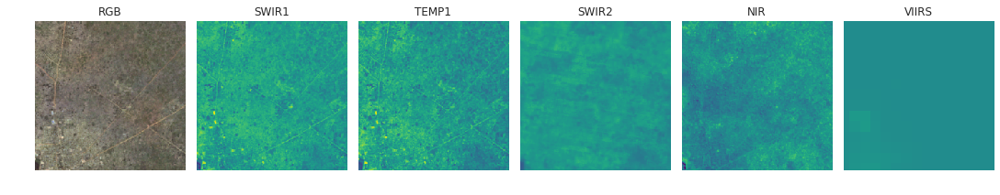

2-th largest (-) delta, loc = ethiopia (6.630950, 36.785202)
(2011) 0.625912, (2015) -1.066322, diff=-1.692234


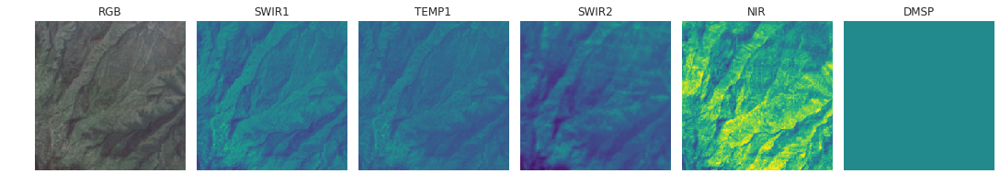

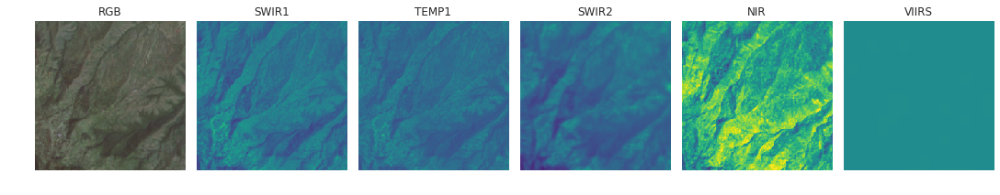

3-th largest (-) delta, loc = tanzania (-6.160680, 39.195229)
(2008) 1.388330, (2012) -0.187544, diff=-1.575875


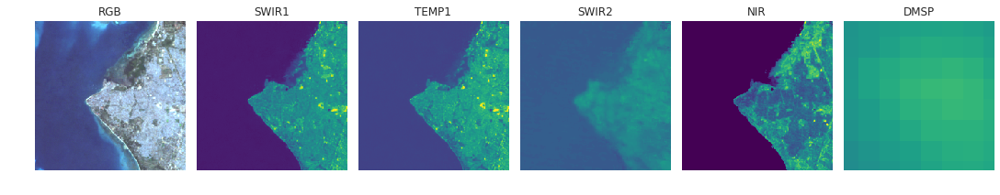

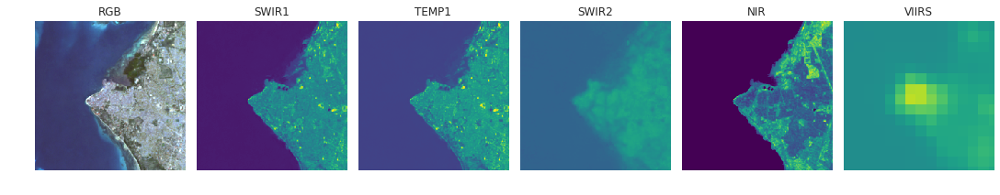

4-th largest (-) delta, loc = tanzania (-6.161320, 39.198002)
(2008) 1.642586, (2012) 0.112486, diff=-1.530100


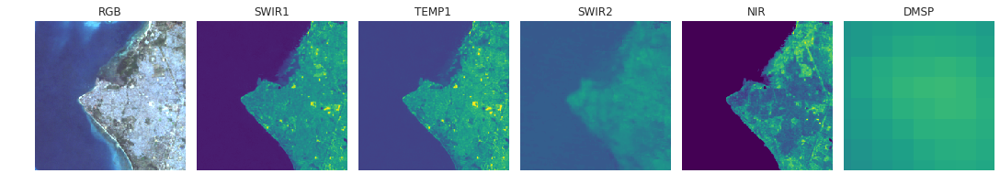

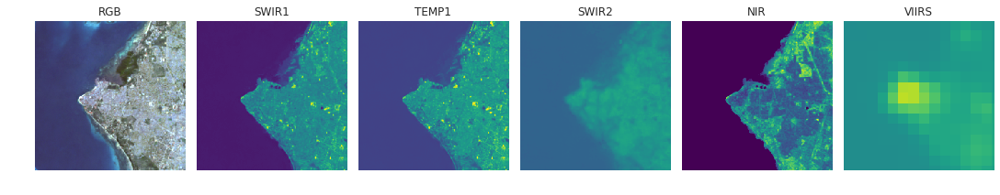

5-th largest (-) delta, loc = tanzania (-5.847910, 39.295750)
(2008) 0.485104, (2012) -0.887715, diff=-1.372819


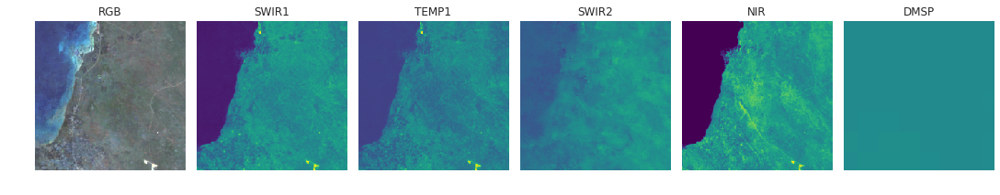

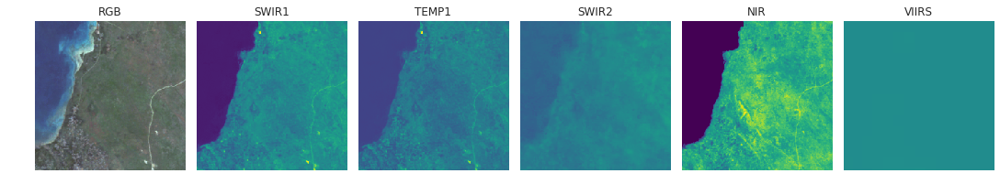

6-th largest (-) delta, loc = tanzania (-8.747230, 39.415199)
(2008) 0.195183, (2012) -1.031785, diff=-1.226968


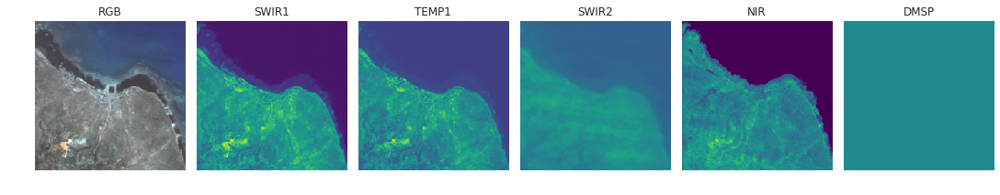

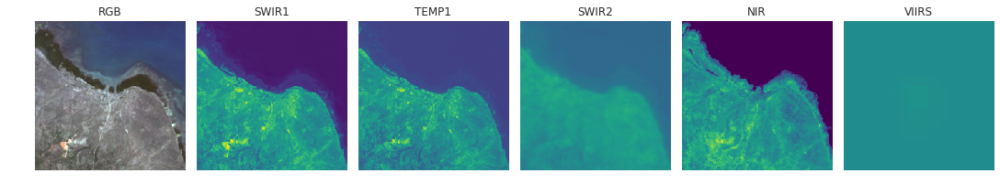

7-th largest (-) delta, loc = uganda (0.305941, 32.529144)
(2005) 1.839000, (2013) 0.701365, diff=-1.137635


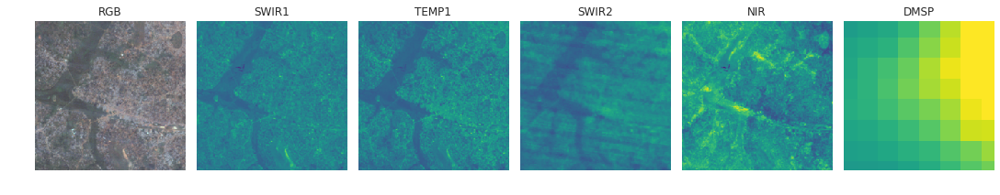

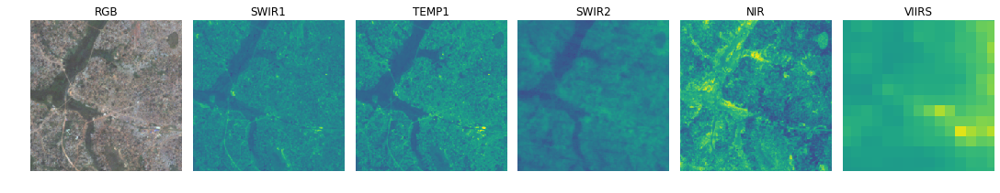

8-th largest (-) delta, loc = tanzania (-6.796120, 39.204609)
(2008) 0.677824, (2012) -0.457623, diff=-1.135447


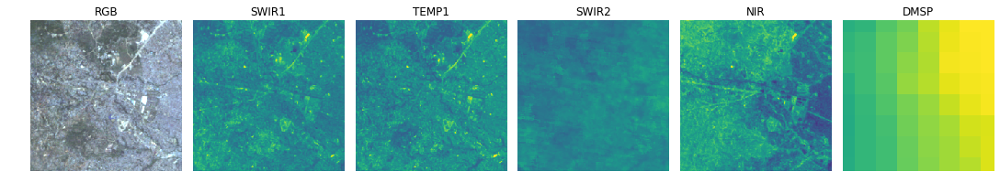

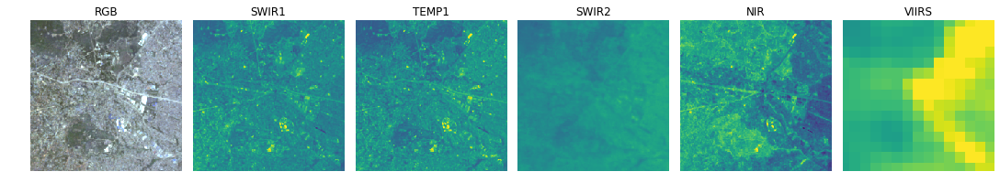

In [46]:
sorted_delta_indices = np.argsort(deltas)
paired_indices = delta_pairs_df.loc[sorted_delta_indices[:K], ['index1', 'index2']].values
images1 = get_images(tfrecord_paths[paired_indices[:, 0]])
images2 = get_images(tfrecord_paths[paired_indices[:, 1]])

plot_images_by_delta(
    paired_indices, images1, images2, labels, years, locs,
    order='largest (-)',
    countries=dataset_constants.LSMS_COUNTRIES,
    country_labels=country_labels)

## Smallest absolute delta

1-th smallest abs. delta, loc = uganda (2.788371, 30.909168)
(2009) -0.059568, (2013) -0.059568, diff=0.000000


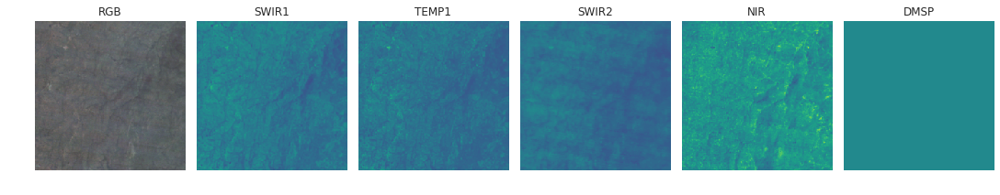

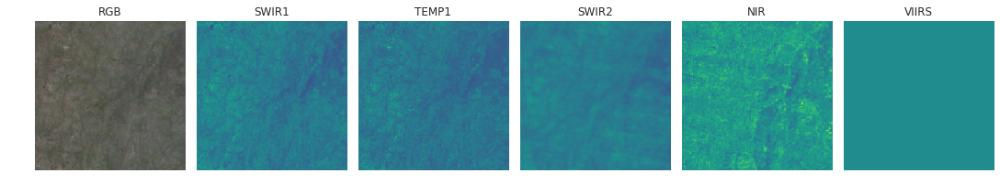

2-th smallest abs. delta, loc = ethiopia (6.985894, 36.425522)
(2011) -1.099996, (2015) -1.099996, diff=0.000000


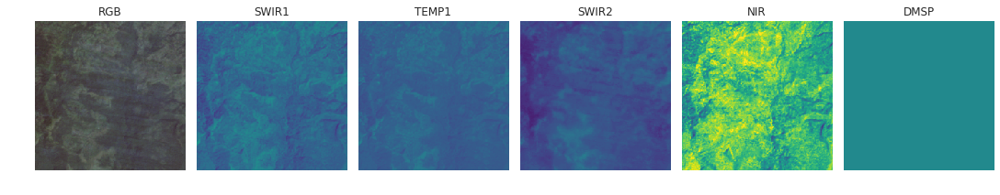

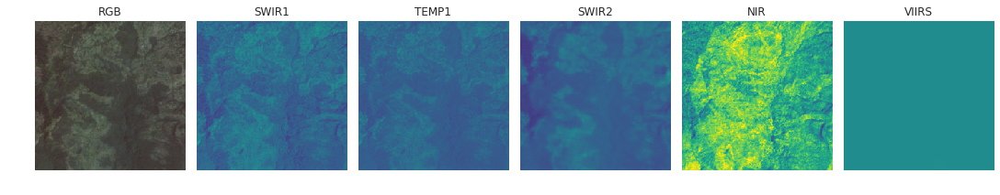

3-th smallest abs. delta, loc = uganda (2.581154, 34.575676)
(2005) -1.317778, (2013) -1.317778, diff=0.000000


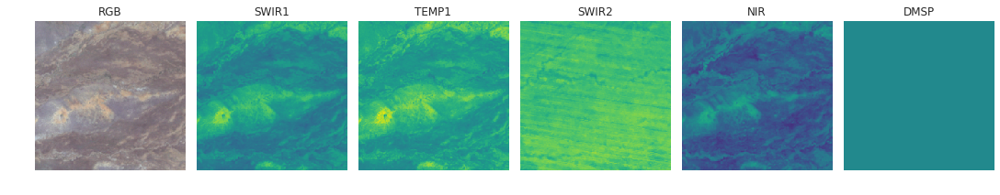

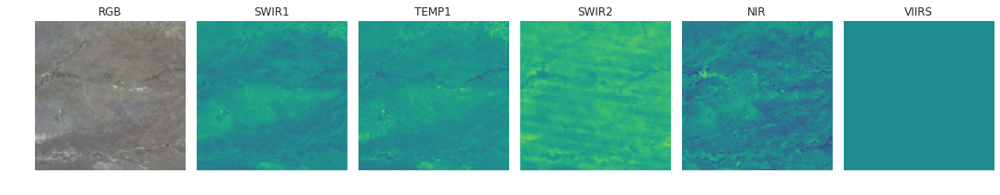

4-th smallest abs. delta, loc = uganda (2.581154, 34.575676)
(2009) -1.317778, (2013) -1.317778, diff=0.000000


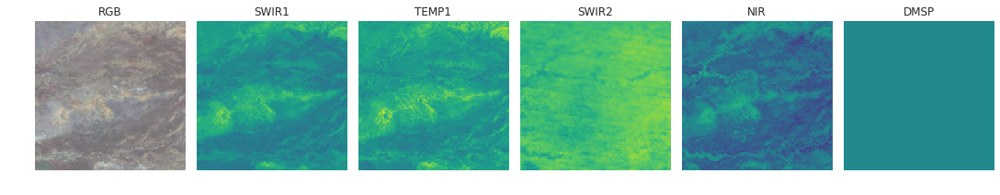

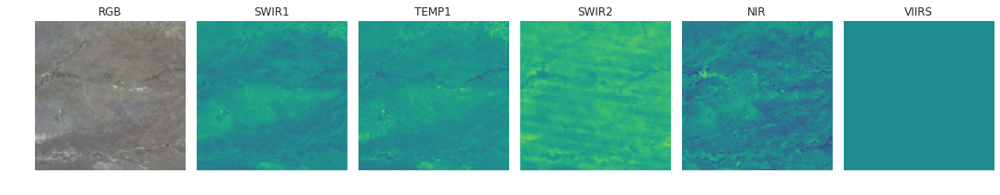

5-th smallest abs. delta, loc = uganda (2.581154, 34.575676)
(2005) -1.317778, (2009) -1.317778, diff=0.000000


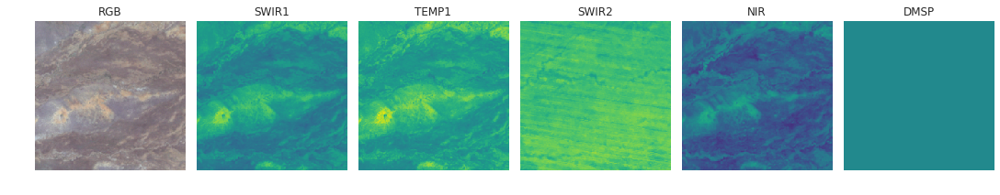

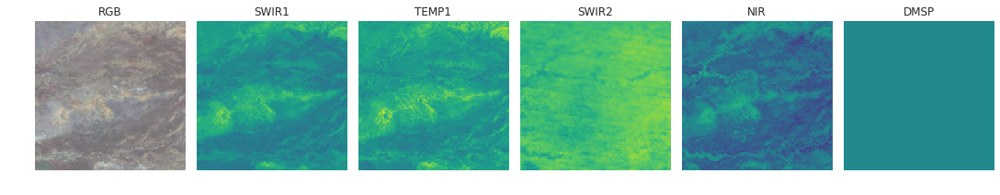

6-th smallest abs. delta, loc = tanzania (-8.576160, 39.232498)
(2008) -0.726160, (2012) -0.725738, diff=0.000422


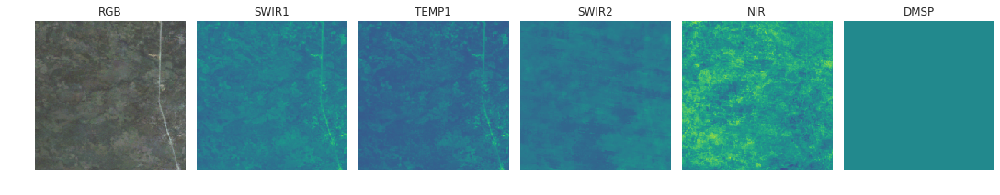

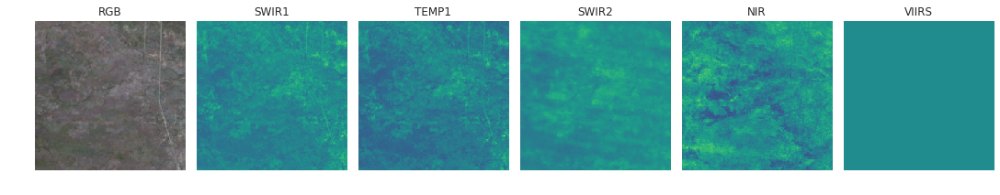

7-th smallest abs. delta, loc = nigeria (11.846711, 3.665294)
(2010) 1.012035, (2015) 1.010946, diff=-0.001089


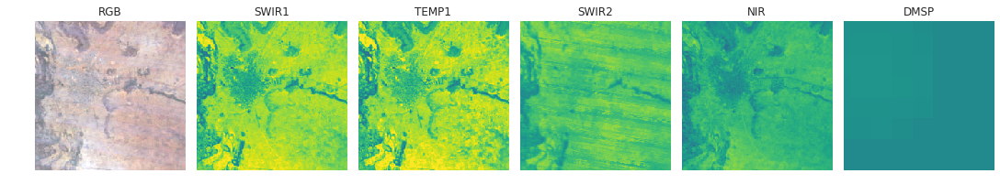

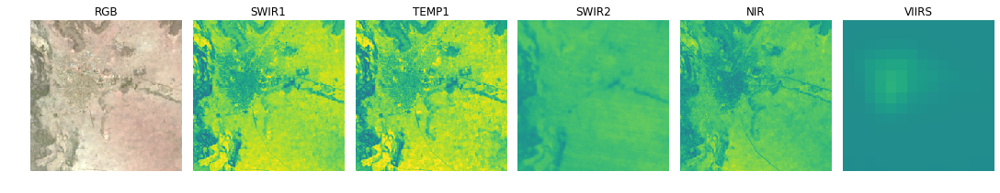

8-th smallest abs. delta, loc = malawi (-13.934700, 33.493999)
(2010) -0.423990, (2016) -0.425107, diff=-0.001117


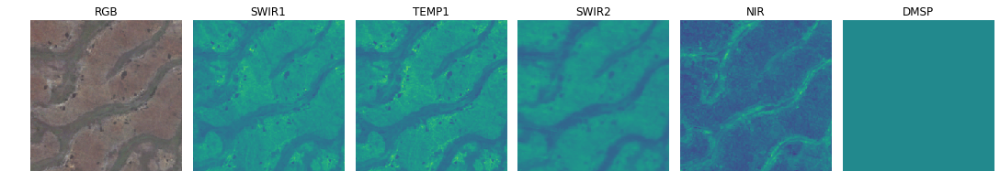

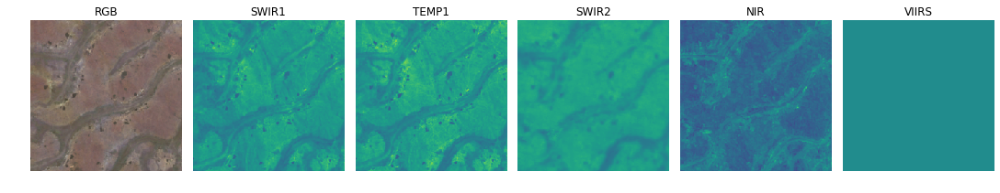

In [47]:
sorted_delta_indices = np.argsort(np.abs(deltas))
paired_indices = delta_pairs_df.loc[sorted_delta_indices[:K], ['index1', 'index2']].values
images1 = get_images(tfrecord_paths[paired_indices[:, 0]])
images2 = get_images(tfrecord_paths[paired_indices[:, 1]])

plot_images_by_delta(
    paired_indices, images1, images2, labels, years, locs,
    order='smallest abs.',
    countries=dataset_constants.LSMS_COUNTRIES,
    country_labels=country_labels)